# Analysis of data at 96h

## insert in barcode assignment table, the morphotype information

In [76]:
library(ggplot2)

In [77]:

barcode_assignment_96h <- readRDS("./files/demultiplexing/barcode_assignment_96h.rds")
head(barcode_assignment_96h)
dim(barcode_assignment_96h)



,cell,Bar1,Bar2,Bar3,Bar4,Bar5,Bar6,Bar7,Bar8,Bar9,⋯,Bar16,Bar17,Bar18,Bar19,Bar20,Bar21,Bar22,Bar23,Bar24,V1
,<chr>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,⋯,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<chr>
1,AAACCCAGTAAGGCCA,2,6,4,7,4,9,11,3,10,⋯,18,13,10,5,3,2,7,37,0,Bar23
2,AAACCCATCGGTCACG,12,8,8,5,482,6,3,3,5,⋯,27,8,10,3,3,28,6,3,2,Doublet
3,AAACCCATCTGCATGA,6,7,10,4,3,7,3,7,14,⋯,33,11,4,43,2,4,8,4,6,Bar19
4,AAACGAAAGCCTATCA,224,1,3,38,8,4,3,6,14,⋯,16,17,10,4,3,3,6,6,9,Doublet
5,AAACGAAAGGAAGAAC,5,2,5,2,6,3,2,3,9,⋯,19,8,441,3,5,1,11,2,2,Bar18
6,AAACGAACAATACGAA,9,3,5,7,3,8,11,3,7,⋯,21,606,4,5,5,3,6,6,9,Bar17


[1] 7375   26

In [78]:
dim(barcode_assignment_96h)
# Remove negative and doublet cells
Negative<-which(grepl("Negative", barcode_assignment_96h$V1))
barcode_assignment_96h<-barcode_assignment_96h[-c(Negative),]
Doublet<-which(grepl("Doublet", barcode_assignment_96h$V1))
barcode_assignment_96h<-barcode_assignment_96h[-c(Doublet),]
dim(barcode_assignment_96h)

[1] 7375   26

[1] 5874   26

In [79]:
phenoTable_96h <- readRDS("./files/demultiplexing/PhenoTable_after_demultiplexing_96h.rds")
head(phenoTable_96h)
dim(phenoTable_96h)

,bar,Sample,Multi_BC,Multi_BC_#,Plate,Morphotype,Area,Perim,Major,Minor,⋯,BRA_Major,BRA_Minor,BRA_Circ,BRA_AR,BRA_Round,BRA_Solidity,BRA_Fraction,barcodes,experiment,n_cells
,<chr>,<chr>,<chr>,<chr>,<dbl>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<int>
1,Bar1,A2,CCTTGGCACCCGAGAATTCCACCACAATGAAAAAAAAAAAAAAAAAAAAAAAAAAAAAA,A2,5,teardrop,129485.12,2034.964,417.245,395.129,⋯,360.065,344.196,0.674,1.046,0.956,0.957,0.7517229,CCACAATG,96h,329
2,Bar10,E2,CCTTGGCACCCGAGAATTCCAGCAACGCCAAAAAAAAAAAAAAAAAAAAAAAAAAAAAA,B3,5,round_ovoid,112522.44,2122.135,400.307,357.896,⋯,323.665,303.445,0.544,1.067,0.938,0.952,0.6855299,GCAACGCC,96h,258
3,Bar11,E11,CCTTGGCACCCGAGAATTCCATAAGGCTCAAAAAAAAAAAAAAAAAAAAAAAAAAAAAA,C3,5,teardrop,134763.75,2129.360,427.491,401.380,⋯,407.016,327.014,0.533,1.245,0.803,0.935,0.7757015,TAAGGCTC,96h,277
4,Bar12,E12,CCTTGGCACCCGAGAATTCCACGATTGACAAAAAAAAAAAAAAAAAAAAAAAAAAAAAA,D3,5,teardrop,122043.62,2281.082,405.625,383.090,⋯,366.737,329.874,0.604,1.112,0.899,0.946,0.7785351,CGATTGAC,96h,261
5,Bar13,F1,CCTTGGCACCCGAGAATTCCAAGCTAGTCAAAAAAAAAAAAAAAAAAAAAAAAAAAAAA,E3,5,elongated,143974.88,2782.269,586.906,312.341,⋯,373.124,230.862,0.507,1.616,0.619,0.928,0.4699023,AGCTAGTC,96h,275
6,Bar14,F3,CCTTGGCACCCGAGAATTCCAATCTCGGAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAA,F3,5,round_ovoid,98645.25,2104.415,386.216,325.204,⋯,293.475,268.975,0.640,1.091,0.917,0.956,0.6284882,ATCTCGGA,96h,197


[1] 24 28

In [80]:
# for 96h 

In [81]:
barcode_assignment_96h$Morphotype <- phenoTable_96h$Morphotype[match(barcode_assignment_96h$V1, phenoTable_96h$bar)]
#table1$val2 <- table2$val2[match(table1$pid, table2$pid)]
head(barcode_assignment_96h)

,cell,Bar1,Bar2,Bar3,Bar4,Bar5,Bar6,Bar7,Bar8,Bar9,⋯,Bar17,Bar18,Bar19,Bar20,Bar21,Bar22,Bar23,Bar24,V1,Morphotype
,<chr>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,⋯,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<chr>,<chr>
1,AAACCCAGTAAGGCCA,2,6,4,7,4,9,11,3,10,⋯,13,10,5,3,2,7,37,0,Bar23,teardrop
3,AAACCCATCTGCATGA,6,7,10,4,3,7,3,7,14,⋯,11,4,43,2,4,8,4,6,Bar19,teardrop
5,AAACGAAAGGAAGAAC,5,2,5,2,6,3,2,3,9,⋯,8,441,3,5,1,11,2,2,Bar18,teardrop
6,AAACGAACAATACGAA,9,3,5,7,3,8,11,3,7,⋯,606,4,5,5,3,6,6,9,Bar17,round_ovoid
7,AAACGAACACTCCGAG,1,1,1,0,2,3,0,1,0,⋯,2,0,1,1,2,3,2,1,Bar14,round_ovoid
8,AAACGAACACTGGCGT,7,3,7,1,4,6,4,5,983,⋯,5,5,2,2,2,2,3,1,Bar9,round_ovoid


In [82]:
# add '-1' to cell column to match later with seurat 
barcode_assignment_96h$cell_barcode <- paste(barcode_assignment_96h$cell, '-1', sep = "")


# SEURAT

In [83]:
library(Seurat)

In [84]:
# Load data
data_10X <- Read10X(data.dir = './raw_data/cellranger_results/cr-count_mm10_JV-RNA-3/outs/filtered_feature_bc_matrix/')
Gastruloid_96h <- CreateSeuratObject(counts=data_10X, project='Gastruloid_96h', min.cells=3, min.features=200)

head(Gastruloid_96h)
dim(Gastruloid_96h) # 9405 cells

,orig.ident,nCount_RNA,nFeature_RNA
,<fct>,<dbl>,<int>
AAACCCAAGTGGAAAG-1,Gastruloid_96h,971,592
AAACCCACACTACTTT-1,Gastruloid_96h,2863,1173
AAACCCAGTAAGGCCA-1,Gastruloid_96h,11058,2725
AAACCCATCCACAGGC-1,Gastruloid_96h,4198,1466
AAACCCATCGGTCACG-1,Gastruloid_96h,51006,6676
AAACCCATCTGCATGA-1,Gastruloid_96h,1072,600
AAACGAAAGCCTATCA-1,Gastruloid_96h,1460,719
AAACGAAAGGAAGAAC-1,Gastruloid_96h,42463,6013
AAACGAAAGTGTACCT-1,Gastruloid_96h,949,364


[1] 20235  9405

In [85]:
Gastruloid_96h <- subset(x = Gastruloid_96h, cells = barcode_assignment_96h$cell_barcode)
dim(Gastruloid_96h) # 5874 cells


[1] 20235  5874

In [86]:
metadata_96h <- barcode_assignment_96h[barcode_assignment_96h$cell_barcode %in% rownames(Gastruloid_96h@meta.data),]
head(metadata_96h)


,cell,Bar1,Bar2,Bar3,Bar4,Bar5,Bar6,Bar7,Bar8,Bar9,⋯,Bar18,Bar19,Bar20,Bar21,Bar22,Bar23,Bar24,V1,Morphotype,cell_barcode
,<chr>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,⋯,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<chr>,<chr>,<chr>
1,AAACCCAGTAAGGCCA,2,6,4,7,4,9,11,3,10,⋯,10,5,3,2,7,37,0,Bar23,teardrop,AAACCCAGTAAGGCCA-1
3,AAACCCATCTGCATGA,6,7,10,4,3,7,3,7,14,⋯,4,43,2,4,8,4,6,Bar19,teardrop,AAACCCATCTGCATGA-1
5,AAACGAAAGGAAGAAC,5,2,5,2,6,3,2,3,9,⋯,441,3,5,1,11,2,2,Bar18,teardrop,AAACGAAAGGAAGAAC-1
6,AAACGAACAATACGAA,9,3,5,7,3,8,11,3,7,⋯,4,5,5,3,6,6,9,Bar17,round_ovoid,AAACGAACAATACGAA-1
7,AAACGAACACTCCGAG,1,1,1,0,2,3,0,1,0,⋯,0,1,1,2,3,2,1,Bar14,round_ovoid,AAACGAACACTCCGAG-1
8,AAACGAACACTGGCGT,7,3,7,1,4,6,4,5,983,⋯,5,2,2,2,2,3,1,Bar9,round_ovoid,AAACGAACACTGGCGT-1


In [87]:
# add metadata information

In [88]:
Gastruloid_96h <- AddMetaData(object = Gastruloid_96h, metadata = metadata_96h$V1, col.name = 'Sample.barcode')
Gastruloid_96h <- AddMetaData(object = Gastruloid_96h, metadata = metadata_96h$Morphotype, col.name = 'Morphotype')
head(Gastruloid_96h@meta.data)
dim(Gastruloid_96h) # 5874 cells

,orig.ident,nCount_RNA,nFeature_RNA,Sample.barcode,Morphotype
,<fct>,<dbl>,<int>,<chr>,<chr>
AAACCCAGTAAGGCCA-1,Gastruloid_96h,11058,2725,Bar23,teardrop
AAACCCATCTGCATGA-1,Gastruloid_96h,1072,600,Bar19,teardrop
AAACGAAAGGAAGAAC-1,Gastruloid_96h,42463,6013,Bar18,teardrop
AAACGAACAATACGAA-1,Gastruloid_96h,29634,5210,Bar17,round_ovoid
AAACGAACACTCCGAG-1,Gastruloid_96h,6323,2108,Bar14,round_ovoid
AAACGAACACTGGCGT-1,Gastruloid_96h,79981,7683,Bar9,round_ovoid


[1] 20235  5874

In [89]:
# order sample barcode numerically
library(stringr)

myLevels <- c(data.frame(table(Gastruloid_96h@meta.data$Sample.barcode))$Var1)
myLevels <- str_sort(myLevels, numeric = TRUE)
head(myLevels)

#factor(Gastruloid_48h@meta.data$Sample.barcode, levels= myLevels)
Gastruloid_96h@meta.data$Sample.barcode <- factor(Gastruloid_96h@meta.data$Sample.barcode, levels= myLevels)


[1] "Bar1" "Bar2" "Bar3" "Bar4" "Bar5" "Bar6"

## Metadata table

In [90]:
metadata_96h <- Gastruloid_96h@meta.data

## QC

### Before QC (all samples together)

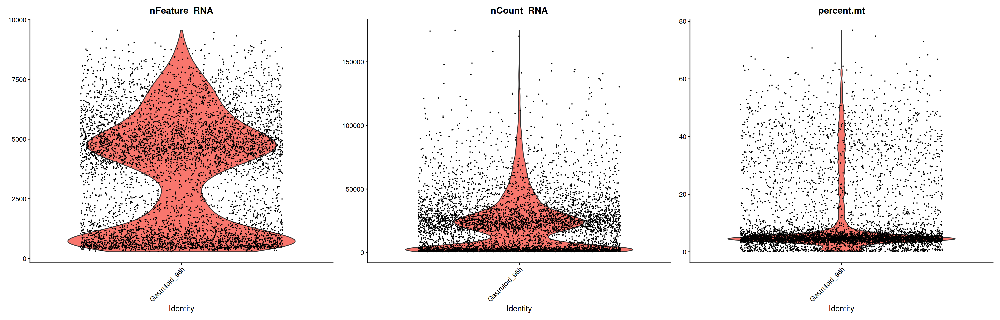

In [91]:
# QC, normalize and scale
library(repr)


Gastruloid_96h[["percent.mt"]] <- PercentageFeatureSet(Gastruloid_96h, pattern = "^mt-")

options(repr.plot.width=25, repr.plot.height=8)
VlnPlot(Gastruloid_96h, features = c("nFeature_RNA", "nCount_RNA", "percent.mt"), ncol = 3)

Warning message:
“Removed 1 rows containing missing values (geom_hline).”
Warning message:
“Removed 1 rows containing missing values (geom_hline).”
Warning message:
“Removed 1 rows containing missing values (geom_hline).”


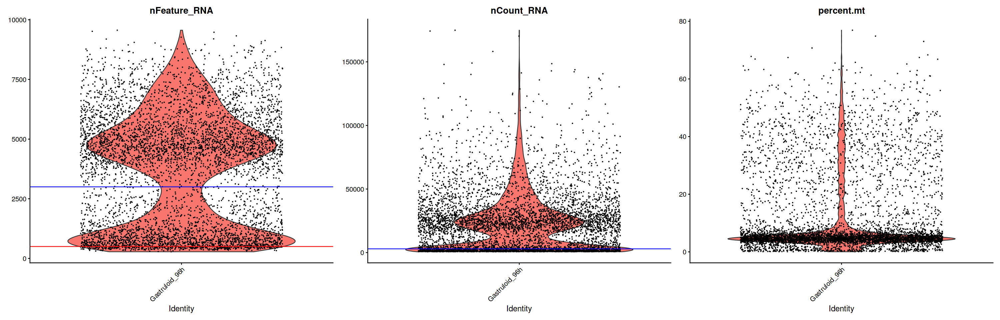

In [96]:
library(ggplot2)
VlnPlot(Gastruloid_96h, features = c("nFeature_RNA", "nCount_RNA", "percent.mt"), ncol = 3) & geom_hline(yintercept = 500, color="red") & geom_hline(yintercept = 3000, color="blue")

### Before QC (individual samples)

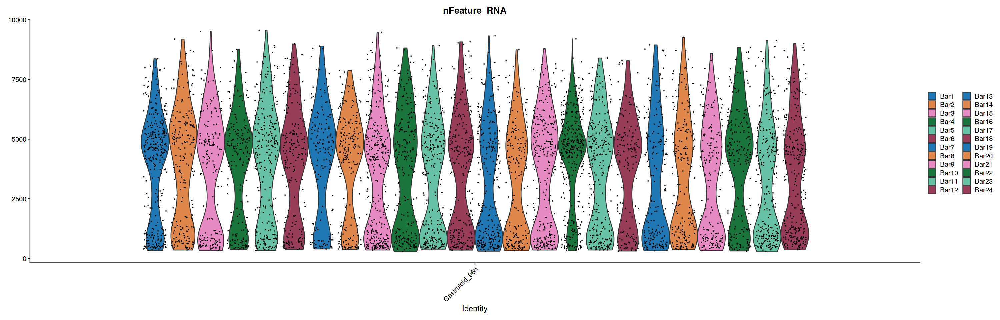

In [97]:
# Change plot size to 8 x 3
options(repr.plot.width=25, repr.plot.height=8)
VlnPlot(Gastruloid_96h, features = c("nFeature_RNA"),
        split.by = "Sample.barcode", cols = c('#1f78b4', '#e78ac3', '#66c2a5'))

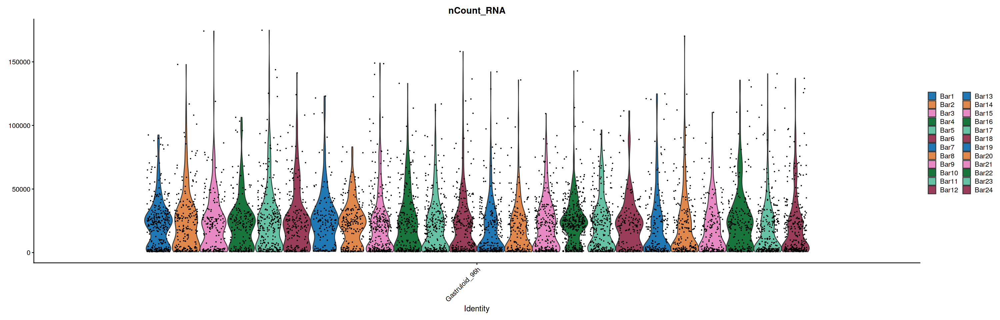

In [98]:
# Change plot size to 8 x 3
options(repr.plot.width=25, repr.plot.height=8)
VlnPlot(Gastruloid_96h, features = c("nCount_RNA"),
        split.by = "Sample.barcode", cols = c('#1f78b4', '#e78ac3', '#66c2a5'))

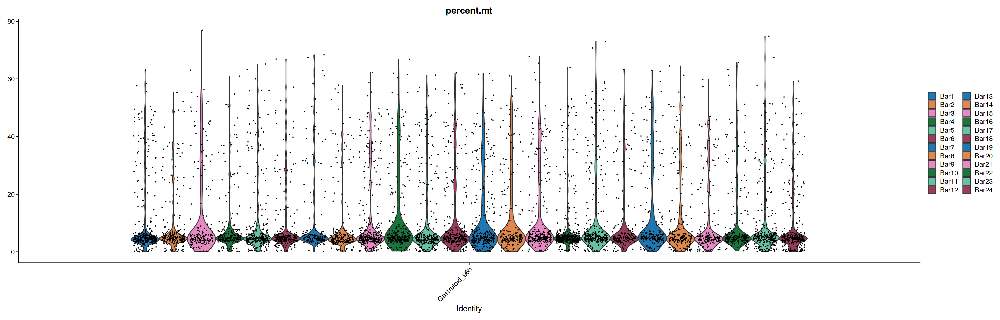

In [99]:
# Change plot size to 8 x 3
options(repr.plot.width=25, repr.plot.height=8)
VlnPlot(Gastruloid_96h, features = c("percent.mt"),
        split.by = "Sample.barcode", cols = c('#1f78b4', '#e78ac3', '#66c2a5'))

In [100]:
library(ggplot2)
# theme
source("https://gist.githubusercontent.com/benmarwick/2a1bb0133ff568cbe28d/raw/fb53bd97121f7f9ce947837ef1a4c65a73bffb3f/geom_flat_violin.R")
theme_niwot <- function(){
  theme_bw() +
    theme(text = element_text(family = "Helvetica Light"),
          axis.text = element_text(size = 16),
          axis.title = element_text(size = 18),
          axis.line.x = element_line(color="black"),
          axis.line.y = element_line(color="black"),
          panel.border = element_blank(),
          panel.grid.major.x = element_blank(),
          panel.grid.minor.x = element_blank(),
          panel.grid.minor.y = element_blank(),
          panel.grid.major.y = element_blank(),
          plot.margin = unit(c(1, 1, 1, 1), units = , "cm"),
          plot.title = element_text(size = 18, vjust = 1, hjust = 0),
          legend.text = element_text(size = 12),
          legend.title = element_blank(),
          legend.position = "right",
          legend.key = element_blank(),
          legend.background = element_rect(color = "black",
                                           fill = "transparent",
                                           size = 2, linetype = "blank"))}

In [101]:
colours <- rep(c('#e41a1c',
'#377eb8',
'#4daf4a',
'#984ea3',
'#ff7f00'), 100)
length(colours)
 # n = number of colors seeked

[1] 500

In [102]:
cellnumber_beforeQC <- c(data.frame(table(metadata_96h$Sample.barcode))$Freq)
#cellnumber_beforeQC

labels_beforeQC <- paste(c(data.frame(table(metadata_96h$Sample.barcode))$Var1), c(data.frame(table(metadata_96h$Sample.barcode))$Freq), sep="-")
#metadata_48h

dim(metadata_96h)

[1] 5874    5

### Before QC (individual samples) > ggplot

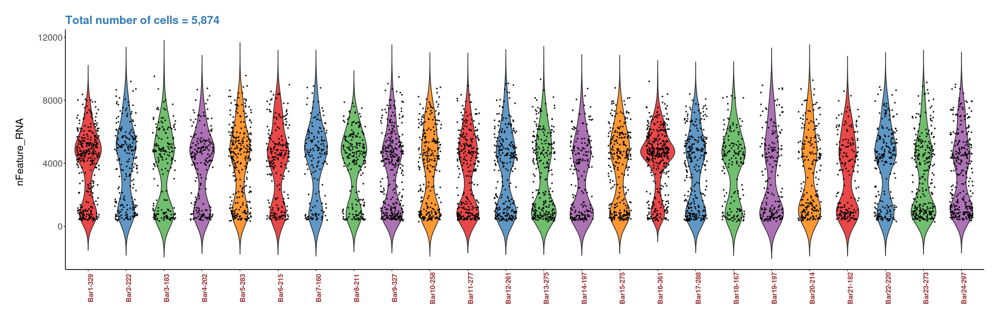

In [103]:
ggplot(data = metadata_96h, 
       aes(x = Sample.barcode, y = (nFeature_RNA), fill= Sample.barcode)) +
  # The half violins
  geom_violin(position = position_nudge(x = 0, y = 0), alpha = 0.8, trim=FALSE) +
  # The points
  geom_point(aes(y = (nFeature_RNA)),
             position = position_jitter(width = 0.3), size = 0.4, alpha = 0.8) +
  # The boxplots
  # geom_boxplot(width = 0.2, outlier.shape = NA, alpha = 0.6) +
  # \n adds a new line which creates some space between the axis and axis title
  labs(y = "nFeature_RNA  \n", x = NULL) +
  # Removing legends
  guides(fill = FALSE, color = FALSE) +
  # Setting the limits of the y axis
  #scale_y_continuous(limits = c(25, 40)) +
  # Picking nicer colours
  scale_fill_manual(values = colours) +
  scale_x_discrete(labels=as.character(labels_beforeQC)) +
  theme_niwot() +
  #geom_hline(yintercept=1000, linetype="dashed", color = "red") +
  ggtitle("Total number of cells = 5,874") +
  theme(axis.text.x = element_text(face="bold", color="#993333", 
                           size=12, angle=90),
       plot.title = element_text(color="#377eb8", size=20, face="bold"))

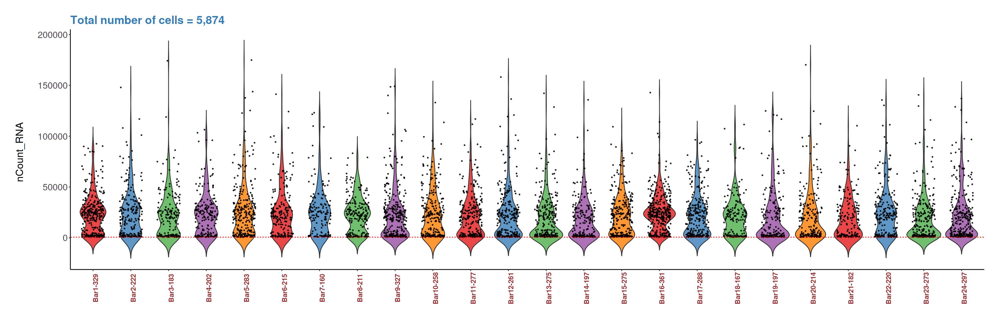

In [104]:
ggplot(data = metadata_96h, 
       aes(x = Sample.barcode, y = (nCount_RNA), fill= Sample.barcode)) +
  # The half violins
  geom_violin(position = position_nudge(x = 0, y = 0), alpha = 0.8, trim=FALSE) +
  # The points
  geom_point(aes(y = (nCount_RNA)),
             position = position_jitter(width = 0.3), size = 0.4, alpha = 0.8) +
  # The boxplots
  # geom_boxplot(width = 0.2, outlier.shape = NA, alpha = 0.6) +
  # \n adds a new line which creates some space between the axis and axis title
  labs(y = "nCount_RNA  \n", x = NULL) +
  # Removing legends
  guides(fill = FALSE, color = FALSE) +
  # Setting the limits of the y axis
  #scale_y_continuous(limits = c(25, 40)) +
  # Picking nicer colours
  scale_fill_manual(values = colours) +
  scale_x_discrete(labels=as.character(labels_beforeQC)) +
  theme_niwot() +  
  geom_hline(yintercept=500, linetype="dashed", color = "red")+
  ggtitle("Total number of cells = 5,874") +
  theme(axis.text.x = element_text(face="bold", color="#993333", 
                           size=12, angle=90),
       plot.title = element_text(color="#377eb8", size=20, face="bold"))

### After QC (all samples together)

[1] 20235  2767

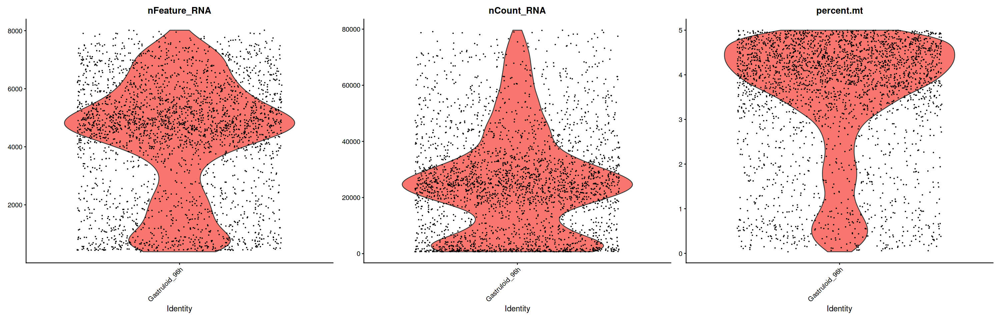

In [106]:
Gastruloid_96h_afterQC <- subset(Gastruloid_96h, subset = nCount_RNA > 500 & nCount_RNA < 80000 & percent.mt < 5)
dim(Gastruloid_96h_afterQC)

VlnPlot(Gastruloid_96h_afterQC, features = c("nFeature_RNA", "nCount_RNA", "percent.mt"), ncol = 3)

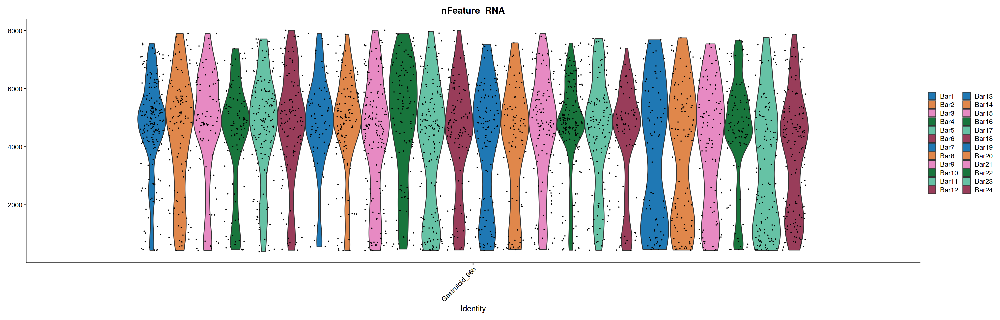

In [107]:
VlnPlot(Gastruloid_96h_afterQC, features = c("nFeature_RNA"),
        split.by = "Sample.barcode", cols = c('#1f78b4', '#e78ac3', '#66c2a5'))

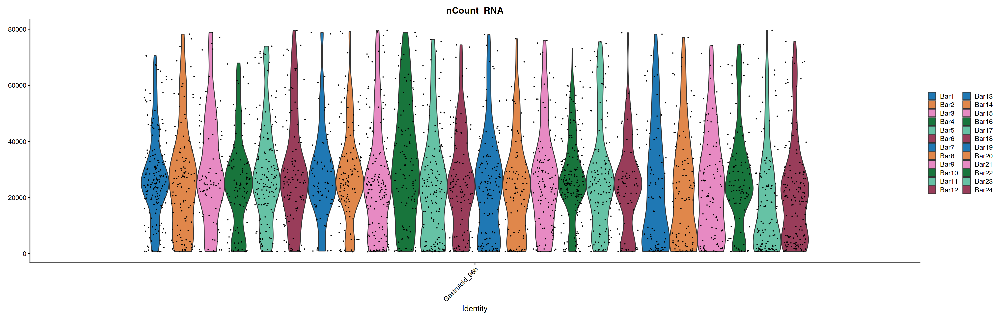

In [108]:
VlnPlot(Gastruloid_96h_afterQC, features = c("nCount_RNA"),
        split.by = "Sample.barcode", cols = c('#1f78b4', '#e78ac3', '#66c2a5'))

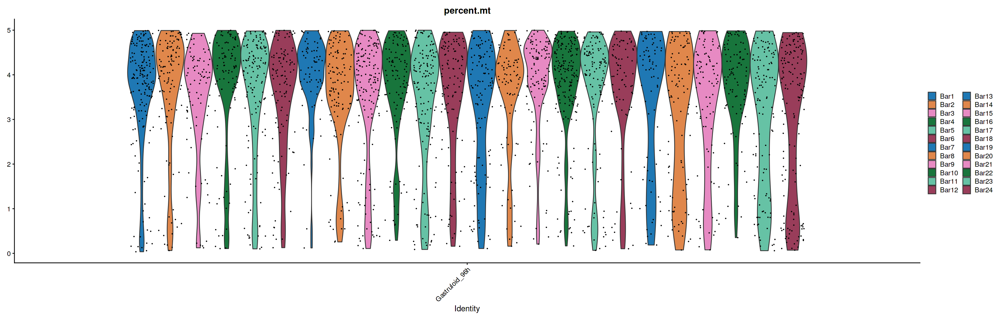

In [109]:
VlnPlot(Gastruloid_96h_afterQC, features = c("percent.mt"),
        split.by = "Sample.barcode", cols = c('#1f78b4', '#e78ac3', '#66c2a5'))

In [110]:
metadata_96h_afterQC <- Gastruloid_96h_afterQC@meta.data
head(metadata_96h_afterQC)
colnames(metadata_96h_afterQC)
dim(metadata_96h_afterQC)

,orig.ident,nCount_RNA,nFeature_RNA,Sample.barcode,Morphotype,percent.mt
,<fct>,<dbl>,<int>,<fct>,<chr>,<dbl>
AAACCCAGTAAGGCCA-1,Gastruloid_96h,11058,2725,Bar23,teardrop,0.1989510
AAACCCATCTGCATGA-1,Gastruloid_96h,1072,600,Bar19,teardrop,0.1865672
AAACGAAAGGAAGAAC-1,Gastruloid_96h,42463,6013,Bar18,teardrop,4.6982079
AAACGAACAATACGAA-1,Gastruloid_96h,29634,5210,Bar17,round_ovoid,4.4408450
AAACGAACACTCCGAG-1,Gastruloid_96h,6323,2108,Bar14,round_ovoid,4.1594180
AAACGAATCAGGAGAC-1,Gastruloid_96h,1172,696,Bar6,teardrop,1.7918089


[1] "orig.ident"     "nCount_RNA"     "nFeature_RNA"   "Sample.barcode"
[5] "Morphotype"     "percent.mt"

[1] 2767    6

,Var1,Freq
,<fct>,<int>
1,Bar1,178
2,Bar2,114
3,Bar3,86
4,Bar4,97
5,Bar5,139
6,Bar6,107


[1] 115.2917

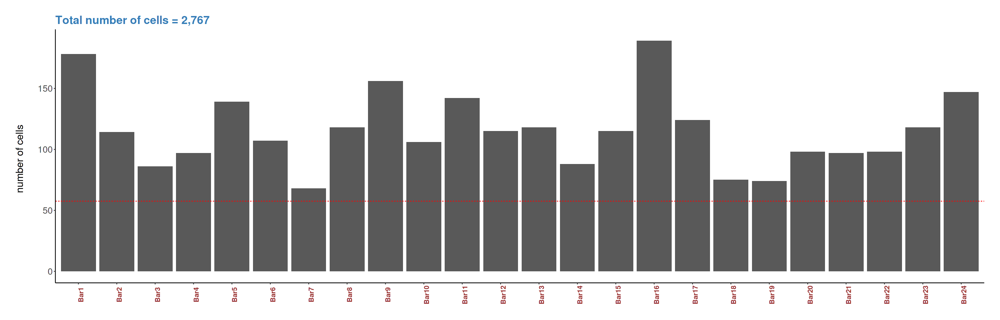

In [111]:
x <- data.frame(table(metadata_96h_afterQC$Sample.barcode))
head(x)
mean(x$Freq)

# Barplot
ggplot(x, aes(x=Var1, y=Freq)) + 
  geom_bar(stat = "identity")+
  # The boxplots
  # geom_boxplot(width = 0.2, outlier.shape = NA, alpha = 0.6) +
  # \n adds a new line which creates some space between the axis and axis title
  labs(y = "number of cells  \n", x = NULL) +
  # Removing legends
  guides(fill = FALSE, color = FALSE) +
  # Setting the limits of the y axis
  #scale_y_continuous(limits = c(25, 40)) +
  # Picking nicer colours
  scale_fill_manual(values = colours) +
  theme_niwot() +
  geom_hline(yintercept=mean(x$Freq)/2, linetype="dashed", color = "red") +
  ggtitle("Total number of cells = 2,767") +
  theme(axis.text.x = element_text(face="bold", color="#993333", 
                           size=12, angle=90),
       plot.title = element_text(color="#377eb8", size=20, face="bold"))

In [112]:
cellnumber_afterQC <- c(data.frame(table(metadata_96h_afterQC$Sample.barcode))$Freq)
#cellnumber_afterQC

labels_afterQC <- paste(c(data.frame(table(metadata_96h_afterQC$Sample.barcode))$Var1), c(data.frame(table(metadata_96h_afterQC$Sample.barcode))$Freq), sep="-")
#labels_afterQC

### After QC (individual samples) > ggplot

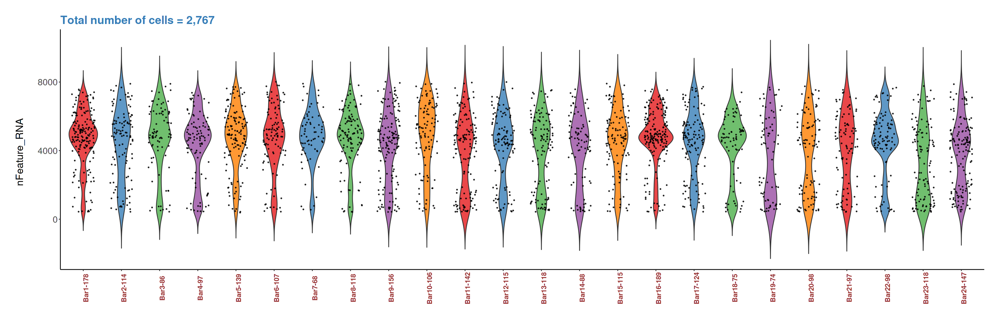

In [113]:
ggplot(data = metadata_96h_afterQC, 
       aes(x = Sample.barcode, y = (nFeature_RNA), fill= Sample.barcode)) +
  # The half violins
  geom_violin(position = position_nudge(x = 0, y = 0), alpha = 0.8, trim=FALSE) +
  # The points
  geom_point(aes(y = (nFeature_RNA)),
             position = position_jitter(width = 0.3), size = 0.4, alpha = 0.8) +
  # The boxplots
  # geom_boxplot(width = 0.2, outlier.shape = NA, alpha = 0.6) +
  # \n adds a new line which creates some space between the axis and axis title
  labs(y = "nFeature_RNA  \n", x = NULL) +
  # Removing legends
  guides(fill = FALSE, color = FALSE) +
  # Setting the limits of the y axis
  #scale_y_continuous(limits = c(25, 40)) +
  # Picking nicer colours
  scale_fill_manual(values = colours) +
  scale_x_discrete(labels=as.character(labels_afterQC)) +
  theme_niwot() +
  ggtitle("Total number of cells = 2,767") +
  theme(axis.text.x = element_text(face="bold", color="#993333", 
                           size=12, angle=90),
       plot.title = element_text(color="#377eb8", size=20, face="bold"))



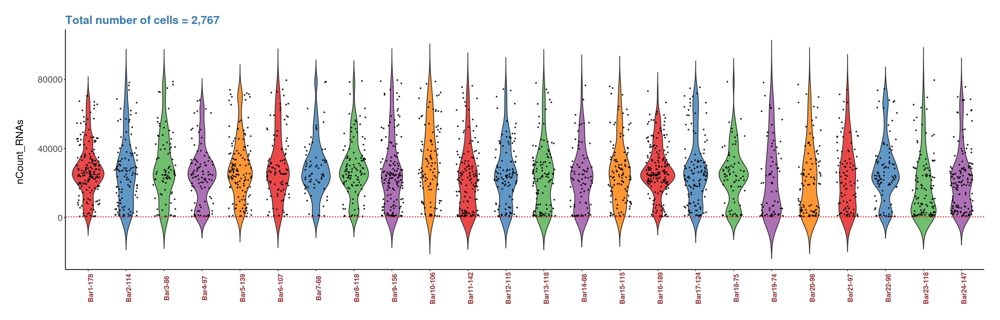

In [114]:
ggplot(data = metadata_96h_afterQC, 
       aes(x = Sample.barcode, y = (nCount_RNA), fill = Sample.barcode)) +
  # The half violins
  geom_violin(position = position_nudge(x = 0, y = 0), alpha = 0.8, trim=FALSE) +
  # The points
  geom_point(aes(y = (nCount_RNA)),
             position = position_jitter(width = 0.3), size = 0.4, alpha = 0.8) +
  # The boxplots
  # geom_boxplot(width = 0.2, outlier.shape = NA, alpha = 0.6) +
  # \n adds a new line which creates some space between the axis and axis title
  labs(y = "nCount_RNAs  \n", x = NULL) +
  # Removing legends
  guides(fill = FALSE, color = FALSE) +
  # Setting the limits of the y axis
  #scale_y_continuous(limits = c(25, 40)) +
  # Picking nicer colours
  scale_fill_manual(values = colours) +
  scale_x_discrete(labels=as.character(labels_afterQC)) +
  theme_niwot() +  
  ggtitle("Total number of cells = 2,767") +
  geom_hline(yintercept=500, linetype="dashed", color = "red")+
  theme(axis.text.x = element_text(face="bold", color="#993333", 
                           size=12, angle=90),
       plot.title = element_text(color="#377eb8", size=20, face="bold"))






# Saving Seurat object & metadata info (after QC)

In [115]:
# Save the files
saveRDS(Gastruloid_96h_afterQC, file = "./files/Seurat_Obj_afterQC/Gastruloid_96h_afterQC.rds")
saveRDS(metadata_96h_afterQC, file = "./files/Seurat_Obj_afterQC/metadata_96h_afterQC.rds")